In [13]:
"""
requirements:
 pip install pandas janome nlpplot matplotlib plotly
"""
import pandas as pd
import nlplot
import pandas as pd
import plotly
from plotly.subplots import make_subplots
from plotly.offline import iplot
import matplotlib.pyplot as plt

import word_wakati as wkt

In [14]:
df = pd.read_csv('datasets/bachelor_themes.csv')
df.head()

,年度,学科／研究科,研究室,学籍番号,賞,氏名,要旨,題目
0,H17,情報科学科,相研,NaN,NaN,NaN,NaN,WEBページにおけるユーザビリティの追及
1,H17,情報科学科,松永研,NaN,NaN,NaN,NaN,安全運転管理教育システム(ASSIST)における複数カメラ使用での交通事故防止対策
2,H17,情報科学科,宮崎研,NaN,NaN,NaN,NaN,電子透かしの体制に関する検討 -加重平均フィルタ・メディアンフィルタの場合-
3,H17,情報科学科,成研,NaN,NaN,NaN,NaN,対面教育を支援するためのウェブ助言システム
4,H17,情報科学科,石田健研,NaN,NaN,NaN,NaN,衛星通信検討のための気象データの解析-2002年のデータ解析-


In [15]:
df["研究室"].unique()

array(['相研', '松永研', '宮崎研', '成研', '石田健研', '中野研', '仲研', '澤田研', '稲永研', '合志研',
       '米元研', '朝廣研', '牛島研', '下川研', '安部研', 'アプドゥハン研', '花野井研', '廣田研', '有田研',
       '坂本研', '松本研', '斉藤研', '一ノ瀬研', '古井研', '田中・安武研', '松永・合志研', '安武研',
       '田中研', '石田俊研', '前田研', '于研'], dtype=object)

In [16]:
# 主要な研究室に限定
labs = ['成研', '石田健研', '仲研', '澤田研', '稲永研', '合志研',
       '米元研', '朝廣研', '下川研', '安部研', 'アプドゥハン研','田中研','安武研']

In [17]:
df["年度"].unique()

array(['H17', 'H18', 'H19', 'H20', 'H21', 'H22', 'H23', 'H24', 'H25',
       'H26', 'H27', 'H28', 'H29', 'H30', 'R01', 'R02', 'R03', 'R04'],
      dtype=object)

In [18]:
years= df["年度"].unique().tolist()
n_years = len(years) # 18年間
print(n_years)

18


In [19]:
# from faker import Faker
# fake = Faker('jp-JP')

In [20]:
# fake_lab=dict()
# for b in labs:
#     fake_lab[b] = fake.name().split()[0] + '研'

fake_lab={'成研': '佐藤研', '石田健研': '木村研', 
          '仲研': '山本研', '澤田研': 'ケリー研', 
          '稲永研': '山本研', '合志研': '石井研', 
          '米元研': '藤井研', '朝廣研': '中川研', 
          '下川研': '井上研', '安部研': '後藤研',
          'アプドゥハン研': '中森研', 
          '田中研': '中澤研', '安武研': '西村研'}
print(fake_lab)

{'成研': '佐藤研', '石田健研': '木村研', '仲研': '山本研', '澤田研': 'ケリー研', '稲永研': '山本研', '合志研': '石井研', '米元研': '藤井研', '朝廣研': '中川研', '下川研': '井上研', '安部研': '後藤研', 'アプドゥハン研': '中森研', '田中研': '中澤研', '安武研': '西村研'}


In [21]:
%matplotlib inline
targets = ['名詞', '形容詞'] #評価対象にする品詞
ignores = ['－', '～', '-', '(', ')', '---', '.','する','ため','用いる','有する'] #無視する記号や単語
mecab = wkt.create_parser(worker='mecab', parts_of_speech=targets, stop_words=ignores)

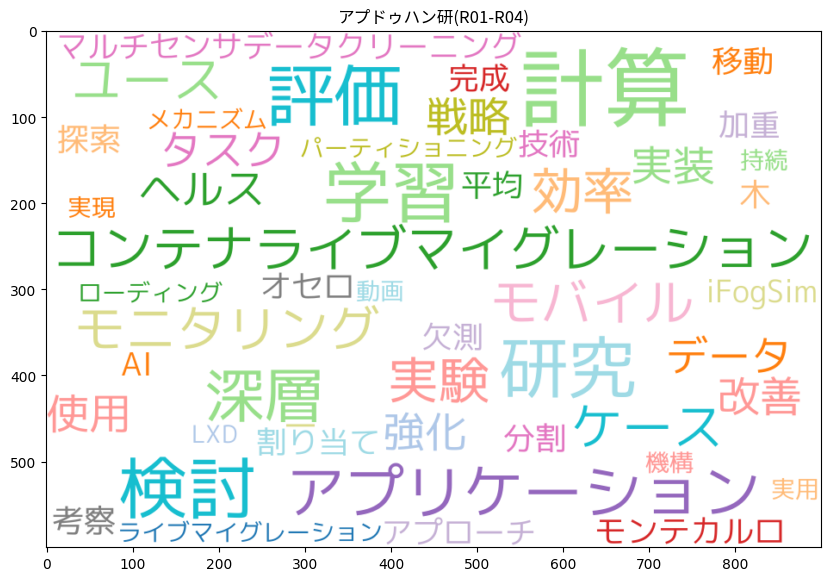

In [22]:
lab, y1, y2 = 'アプドゥハン研', 'R01', 'R04'
lab_ = lab
df1 = None
df1 = df[(df['研究室']==lab) & (df['年度']>=y1) & (df['年度']<=y2)]
titles =  df1.loc[:,['題目']].values
texts =[]
for t in titles:
    texts += [" ".join(wkt.word_seq(t[0], parser=mecab))]
df2 = None
df2 = pd.DataFrame({'text': texts})

npt = nlplot.NLPlot(df2, target_col='text')
# Stopword calculations can be performed.
stopwords = npt.get_stopword(top_n=4, min_freq=0)

fig = plt.figure(figsize=(10, 18))
fig.tight_layout()
fig_wc = npt.wordcloud(
    width = 900,
    height = 600,
    max_words = 50,
    max_font_size = 100,
    colormap = 'tab20_r',
    stopwords =stopwords,
    mask_file = None,
    save=False
)
lab_title = f'{lab_}({y1}-{y2})'
# plt.title(lab_title,fontname="MS Gothic")
plt.title(lab_title,fontname="Noto Sans CJK JP")

#         plt.axis('off')        
plt.imshow(fig_wc, interpolation="bilinear")      
plt.show()

# fig_unigram = npt.bar_ngram(
#     title=lab_title,
#     xaxis_label='出現回数',
#     yaxis_label='単語',
#     ngram=1,
#     top_n=20,
#     width=800,
#     height=1100,
#     color=None,
#     horizon=True,
#     stopwords=stopwords,
#     verbose=False,
#     save=False,
# )
# fig_unigram.show()

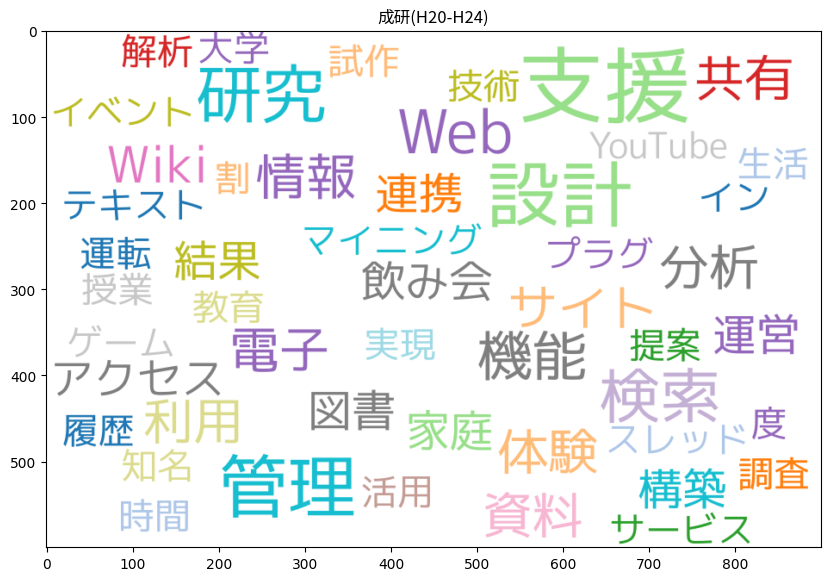

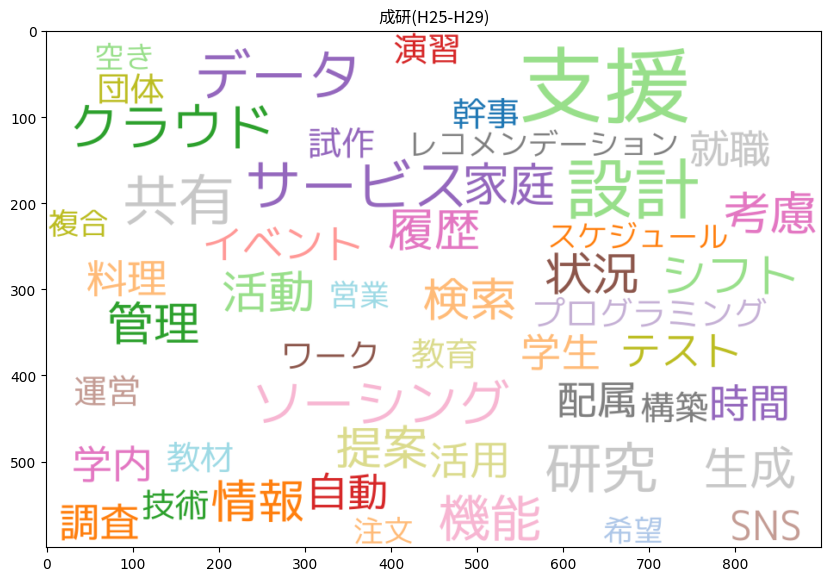

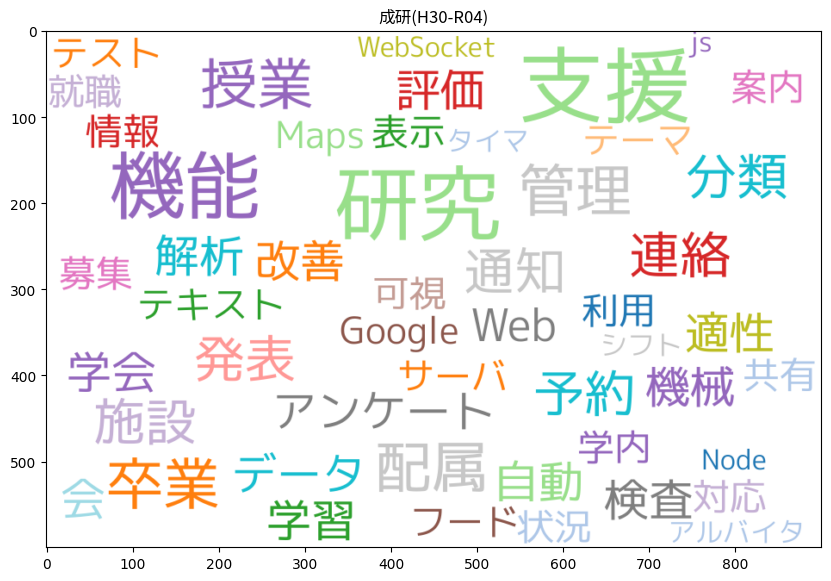

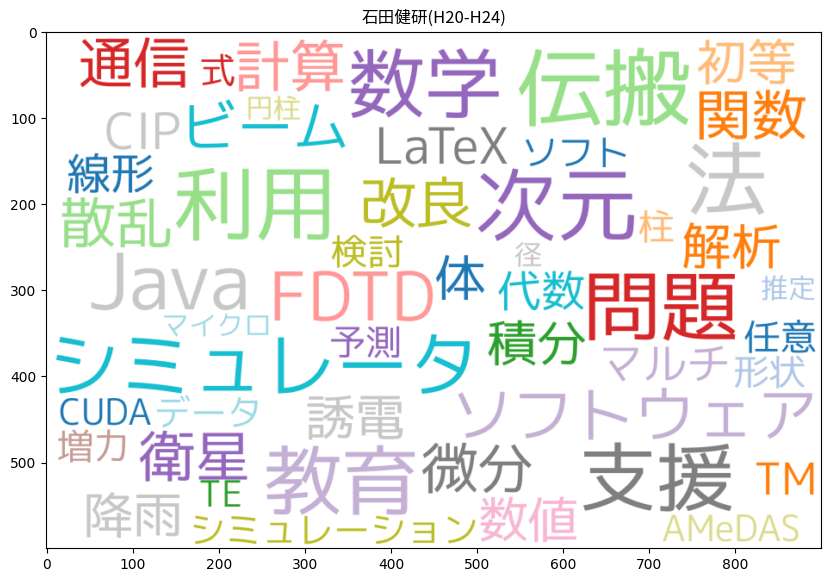

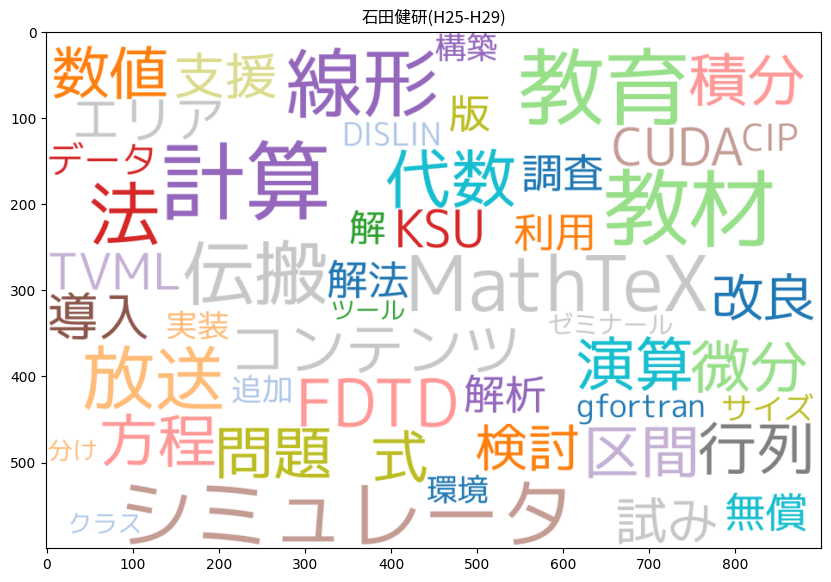

...

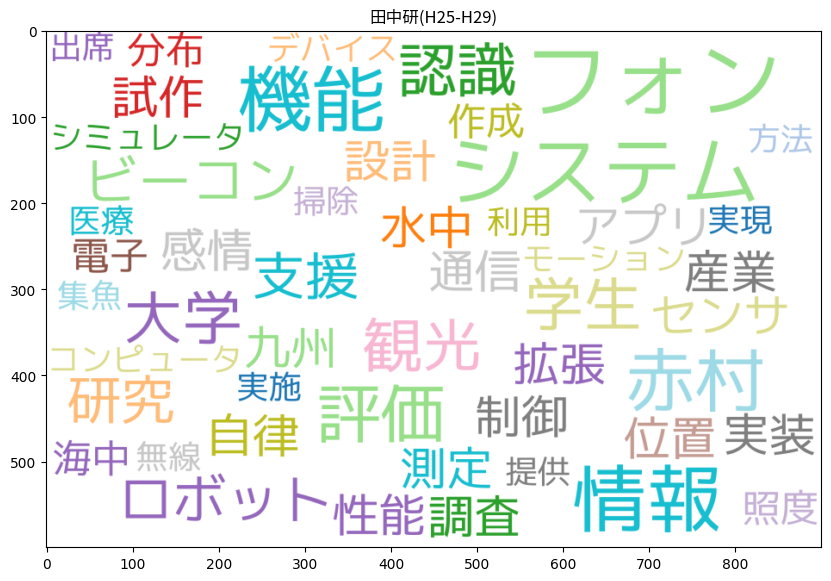

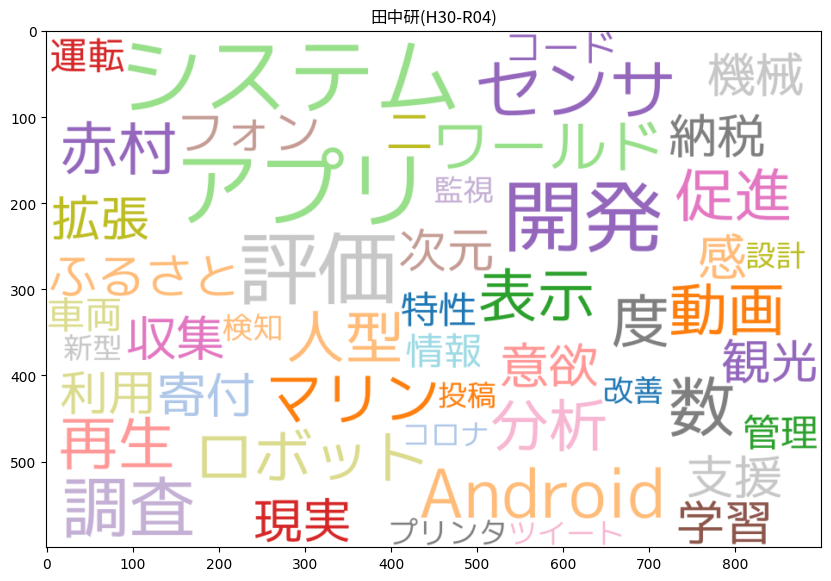

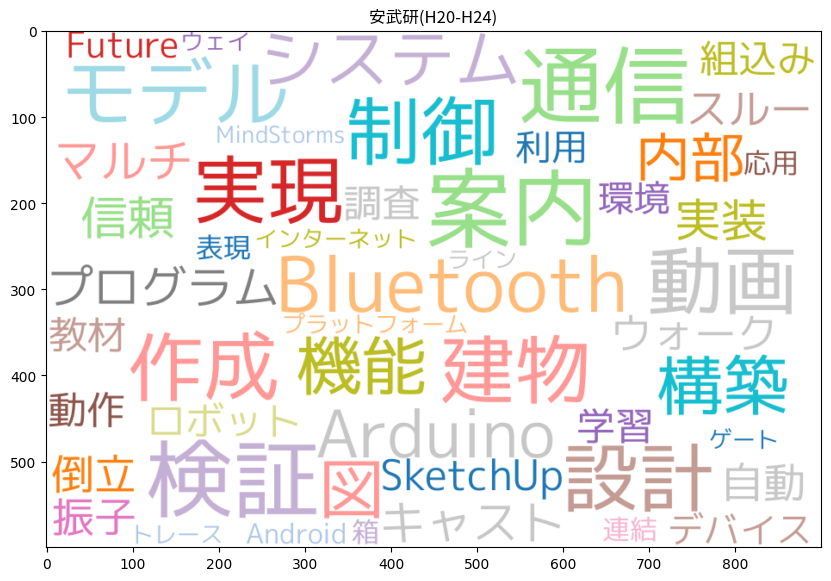

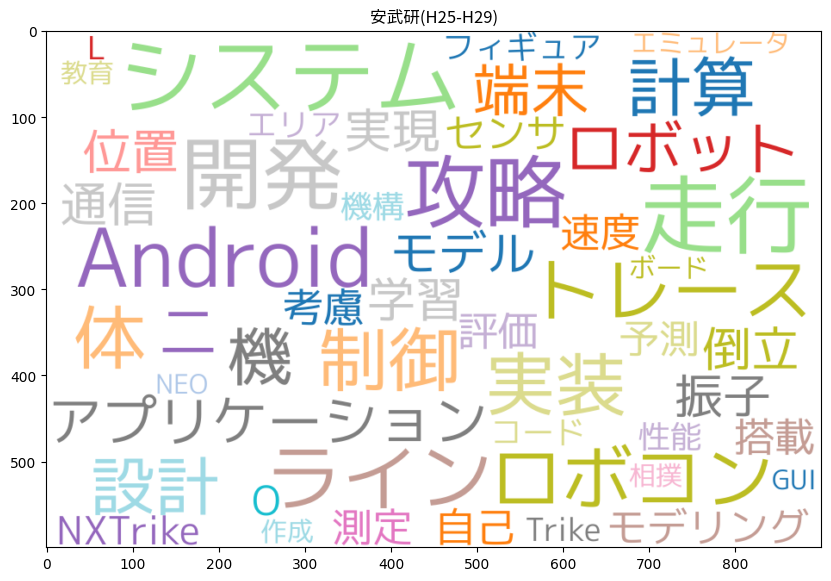

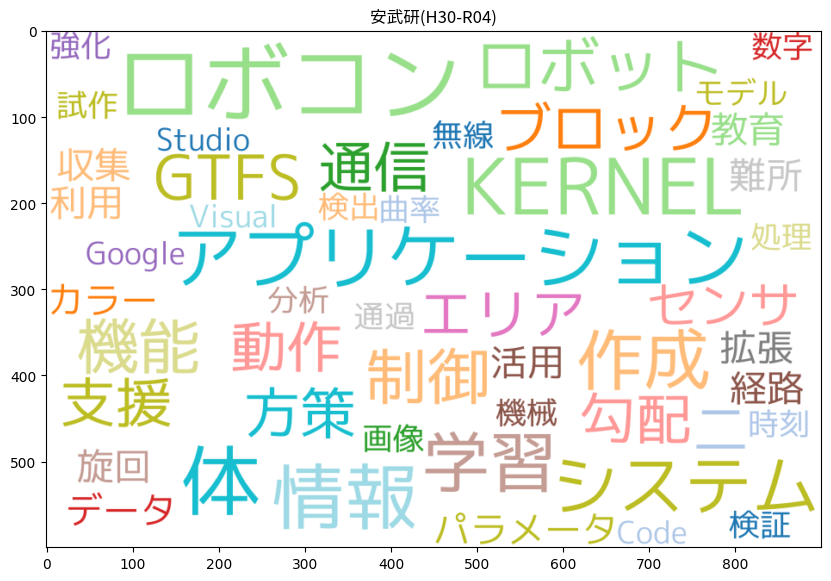

In [23]:
delta = 5 # 調査対象年数 1 3 6 9 18 （必須ではないが18の倍数にする） 
n_div = n_years / delta
m_div = n_years % delta
for lab in labs:
    for y in range(m_div, n_years, delta):
        fig = plt.figure(figsize=(10, 18))
        fig.tight_layout()
        z = y + delta
        z = z - 1 if z - 1 < n_years else n_years-1     
#         print(lab, years[y],years[z])
        lab_ = fake_lab[lab]
        lab_ = lab
    
        df1 = df[(df['研究室']==lab) & (df['年度']>=years[y]) & (df['年度']<=years[z])]
        titles =  df1.loc[:,['題目']].values
        texts =[]
        for t in titles:
            texts += [" ".join(wkt.word_seq(t[0], parser=mecab))]
        df2 = None
        df2 = pd.DataFrame({'text': texts})
 
        npt = nlplot.NLPlot(df2, target_col='text')
        # Stopword calculations can be performed.
        stopwords = npt.get_stopword(top_n=2, min_freq=0)

        fig_wc = npt.wordcloud(
            width = 900,
            height = 600,
            max_words = 50,
            max_font_size = 100,
            colormap = 'tab20_r',
            stopwords =stopwords,
            mask_file = None,
            save=False
        )
        lab_title = f'{lab_}({years[y]}-{years[z]})'
        # plt.title(lab_title,fontname="MS Gothic")
        plt.title(lab_title,fontname="Noto Sans CJK JP")

        # plt.axis('off')        
        plt.imshow(fig_wc, interpolation="bilinear")      
        plt.show()       


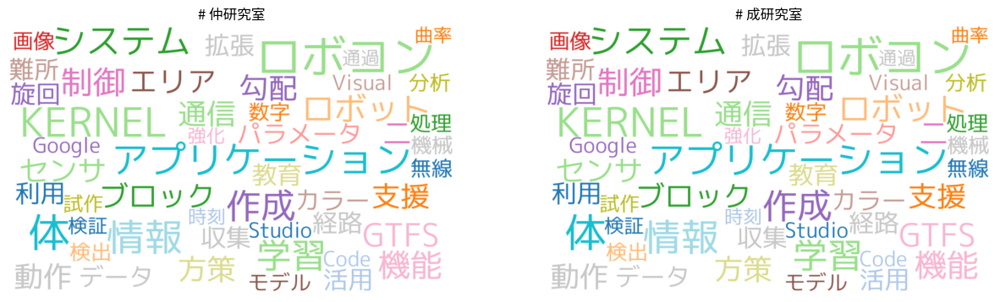

In [25]:
fig_wc = npt.wordcloud(
    width=1000,
    height=600,
    max_words=50,
    max_font_size=100,
    colormap='tab20_r',
    stopwords=stopwords,
    mask_file=None,
    save=False
)
fig = plt.figure(figsize=(15, 25))
fig.tight_layout()
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax1.axis("off")
ax2.axis("off")
# ax1.set_title("# 仲研究室",fontname="MS Gothic")
# ax2.set_title("# 成研究室",fontname="MS Gothic")
ax1.set_title("# 仲研究室",fontname="Noto Sans CJK JP")
ax2.set_title("# 成研究室",fontname="Noto Sans CJK JP")

ax1.imshow(fig_wc, interpolation="bilinear")
ax2.imshow(fig_wc, interpolation="bilinear")

# plt.imshow(fig_wc, interpolation="bilinear")
 
plt.show()